In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from math import ceil, sqrt

IMAGE_COUNT = 14
COLUMNS = 3

images = [
    (
        f"{i+1:02}",
        cv2.imread(f"./images/{i+1:02}.jpg"),
    )
    for i in range(IMAGE_COUNT)
]

def show_images(images, cmap=None):
    plt.figure(figsize=(15,18))
    for index, [title, img] in enumerate(images):
        plt.subplot(ceil(IMAGE_COUNT / COLUMNS), COLUMNS, index+1)
        plt.imshow(img, cmap=cmap)
        plt.title(title)

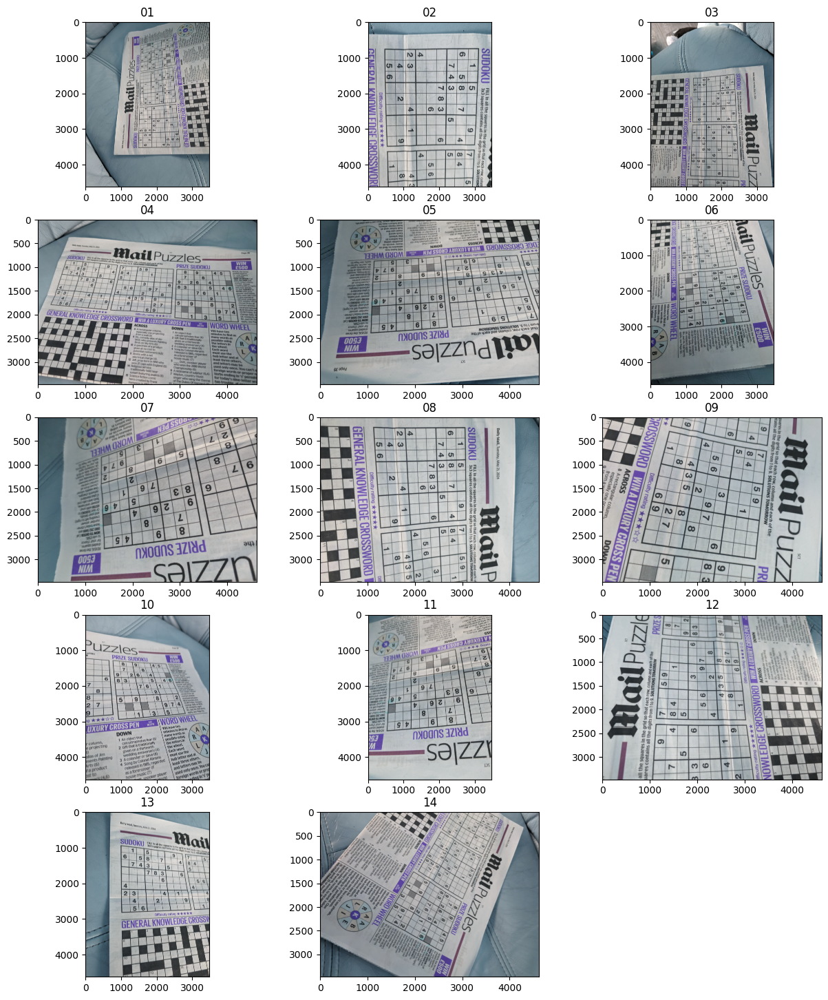

In [2]:
show_images(images)

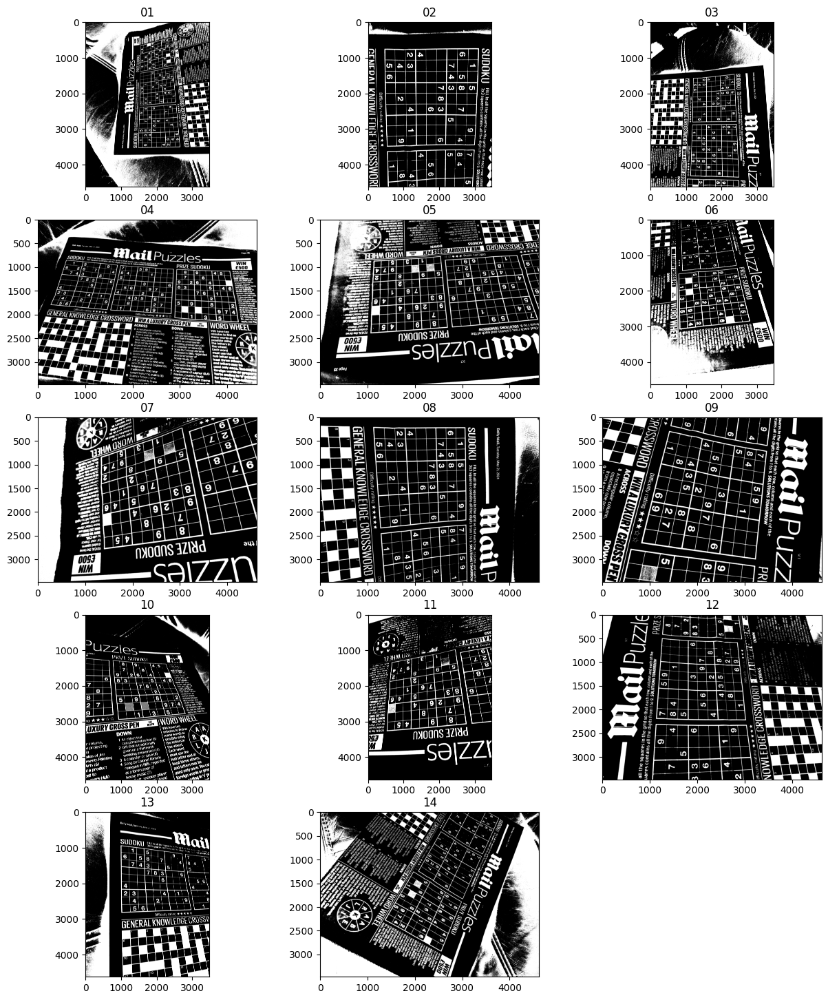

In [3]:
greys = [
    (title, cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)) 
    for title, img in images
]
thresh = [
    (title, cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)[1])
    for title, img in greys
]
inverted = [
    (title, np.invert(img))
    for title, img in thresh
]

show_images(inverted, 'grey')

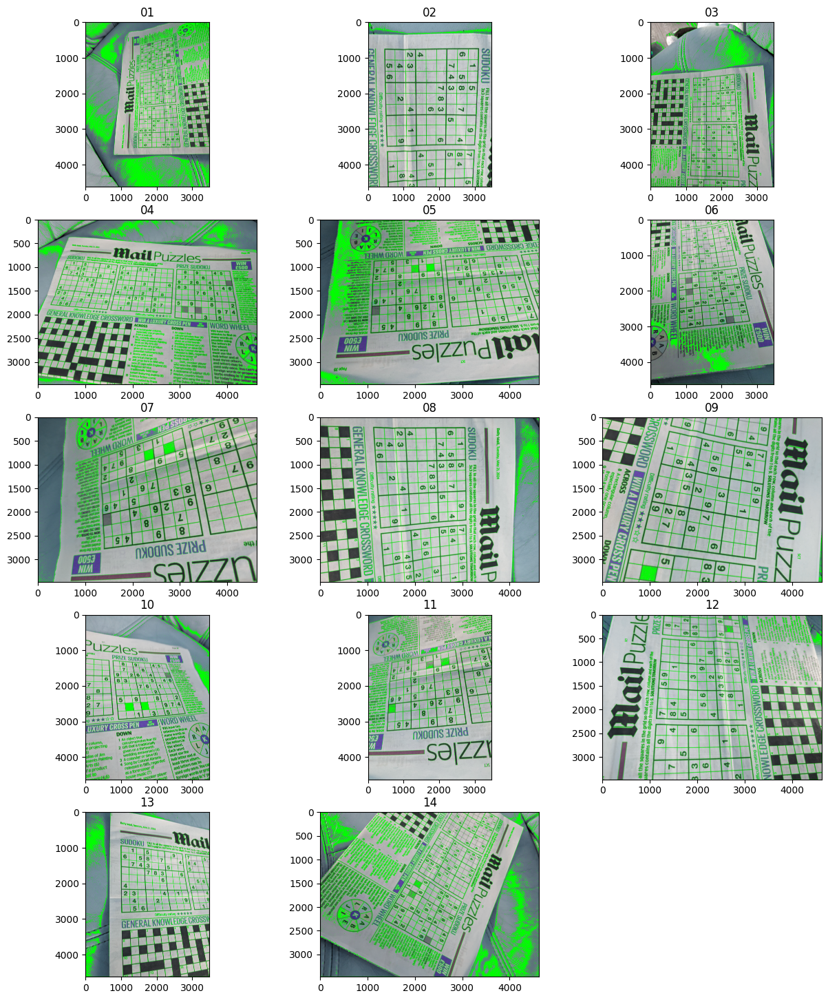

In [4]:
contours = [
    cv2.findContours(inv, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)[0]
    for (_, inv) in inverted
]
images_cpy = [(title, np.copy(img)) for title, img in images]
for (title, img), cnt in zip(images_cpy, contours):
    cv2.drawContours(img, cnt, -1, (0, 255, 0), 3)

show_images(images_cpy)

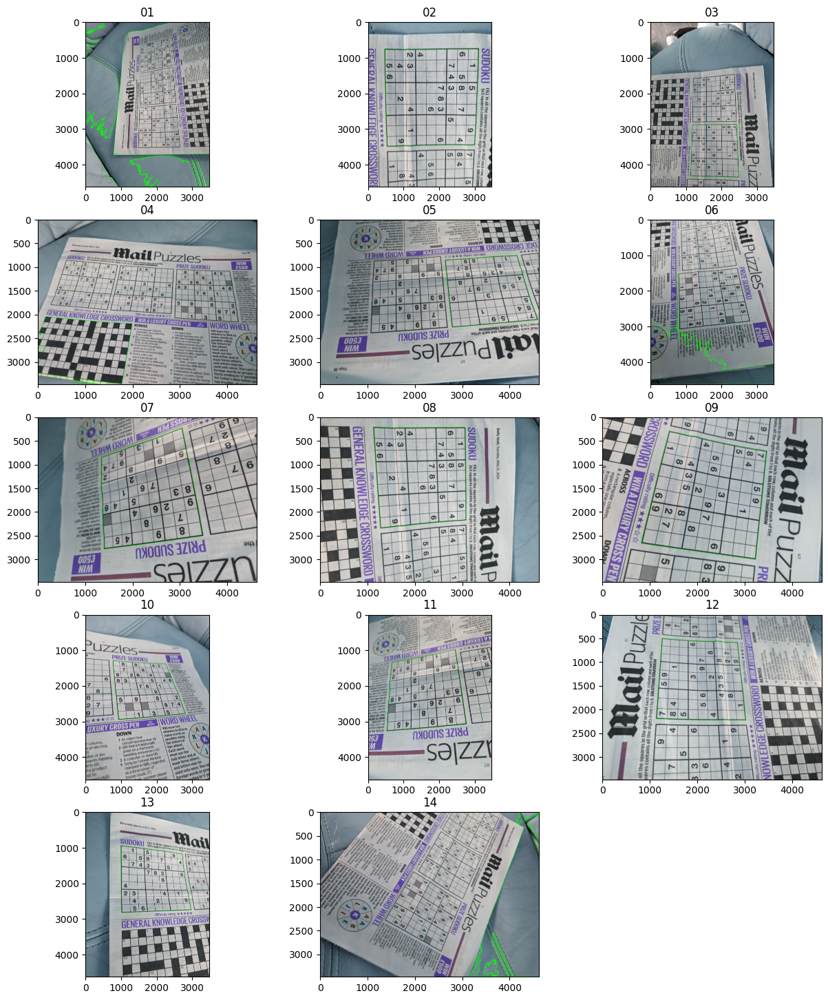

In [5]:
def find_biggest(contours):
    biggest = None
    largest_area = -1
    for cnt in contours:
        area = abs(cv2.contourArea(cnt))
        if area > largest_area:
            biggest = cnt
            largest_area = area
    return biggest

biggest_cnts = [find_biggest(cnts) for cnts in contours]

images_cpy = [(title, np.copy(img)) for title, img in images]
for (title, img), cnt in zip(images_cpy, biggest_cnts):
    cv2.drawContours(img, [cnt], -1, (0, 255, 0), 5)

show_images(images_cpy)

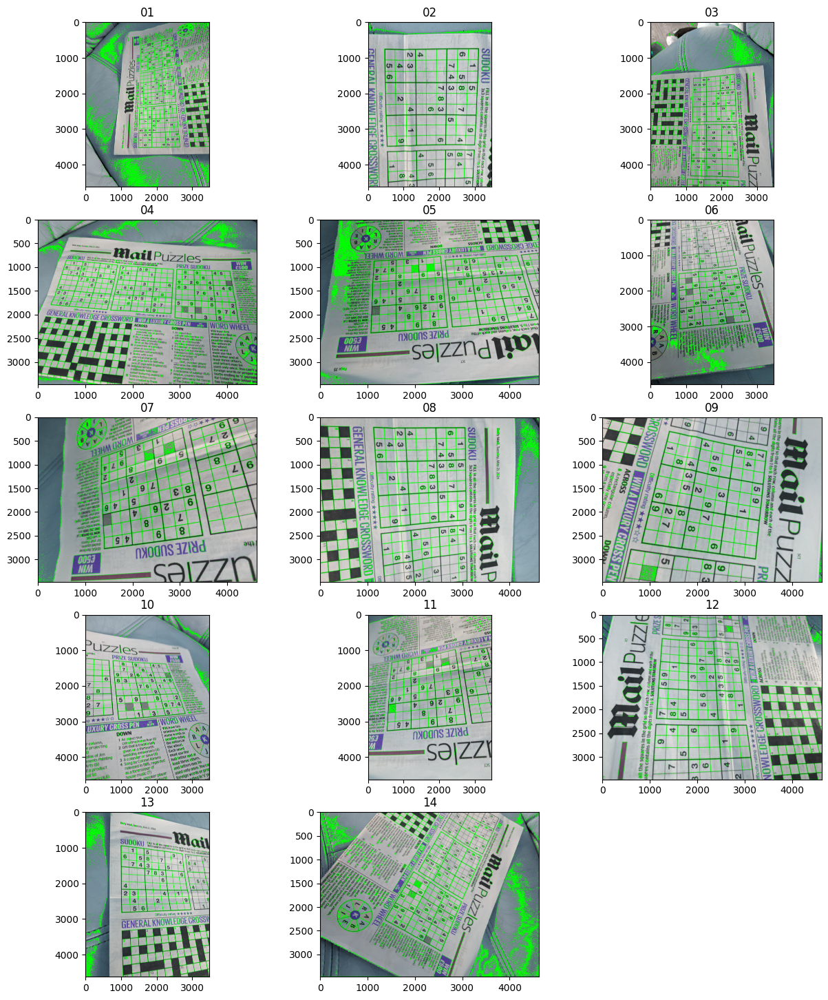

In [6]:
MIN_SOLID_RATIO = 0.85
def find_solids(contours):
    for cnt in contours:
        area = abs(cv2.contourArea(cnt))
        hull = cv2.convexHull(cnt)
        hull_area = abs(cv2.contourArea(hull))
        if hull_area == 0:
            continue
        solidity = float(area)/hull_area
        if solidity >= MIN_SOLID_RATIO:
            yield cnt

solid_cnts = [list(find_solids(cnts)) for cnts in contours]

images_cpy = [(title, np.copy(img)) for title, img in images]
for (title, img), cnts in zip(images_cpy, solid_cnts):
    cv2.drawContours(img, cnts, -1, (0, 255, 0), 5)

show_images(images_cpy)

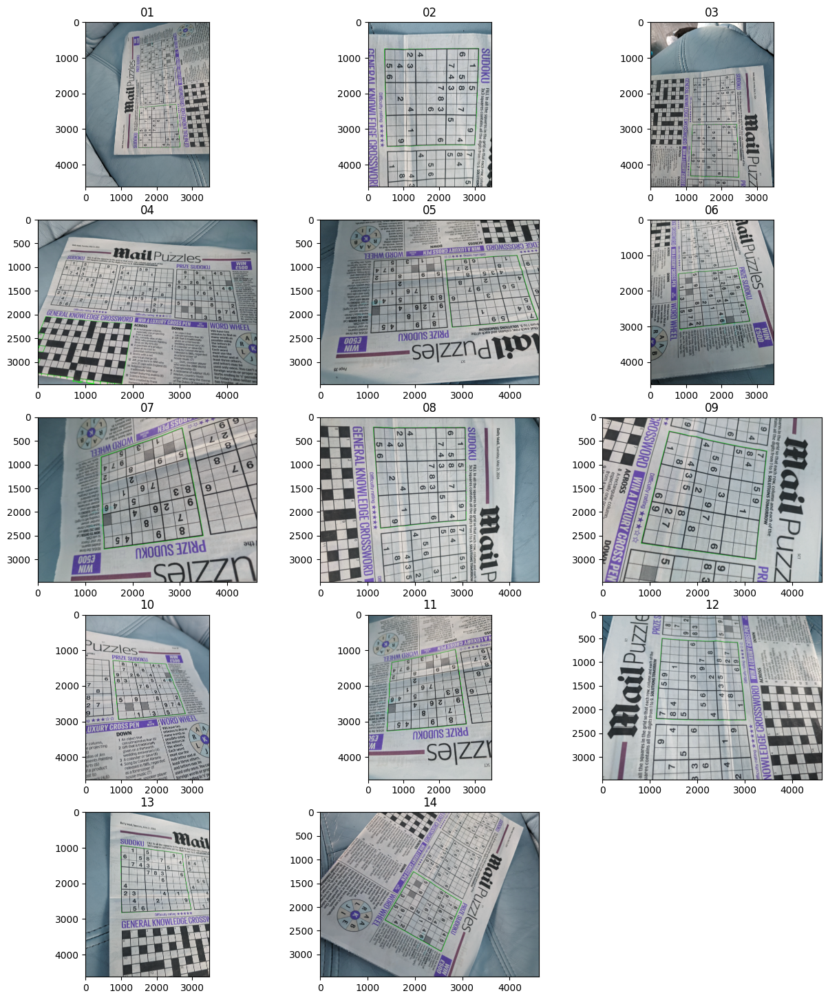

In [7]:
biggest_solid_cnts = [find_biggest(cnts) for cnts in solid_cnts]

images_cpy = [(title, np.copy(img)) for title, img in images]
for (title, img), cnts in zip(images_cpy, biggest_solid_cnts):
    cv2.drawContours(img, cnts, -1, (0, 255, 0), 5)

show_images(images_cpy)

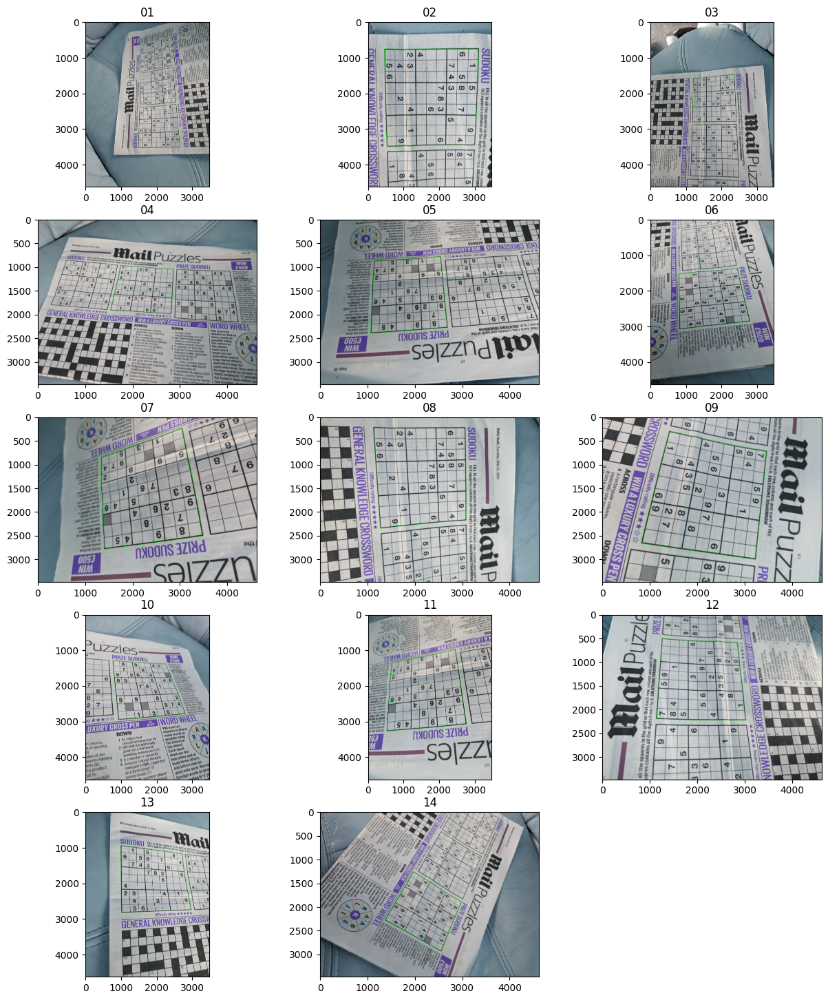

In [8]:
MAX_DISTANCE = 0.25

def distance_from_center(img, cnt):
    M = cv2.moments(cnt)
    cx = int(M['m10']/M['m00'])
    cy = int(M['m01']/M['m00'])
    height, width, _ = img.shape
    return (
        abs(cx - (width / 2)),
        abs(cy - (height / 2)),
    )

def near_center(img, cnts):
    for cnt in cnts:
        dx, dy = distance_from_center(img, cnt)
        height, width, _ = img.shape
    
        if dx / width > MAX_DISTANCE or dy / height > MAX_DISTANCE:
            continue

        yield cnt

biggest_solid_central_cnts = [
    find_biggest(list(near_center(img, cnts))) 
    for (_, img), cnts in zip(images, solid_cnts)
]

images_cpy = [(title, np.copy(img)) for title, img in images]
for (title, img), cnts in zip(images_cpy, biggest_solid_central_cnts):
    cv2.drawContours(img, cnts, -1, (0, 255, 0), 5)

show_images(images_cpy)
    

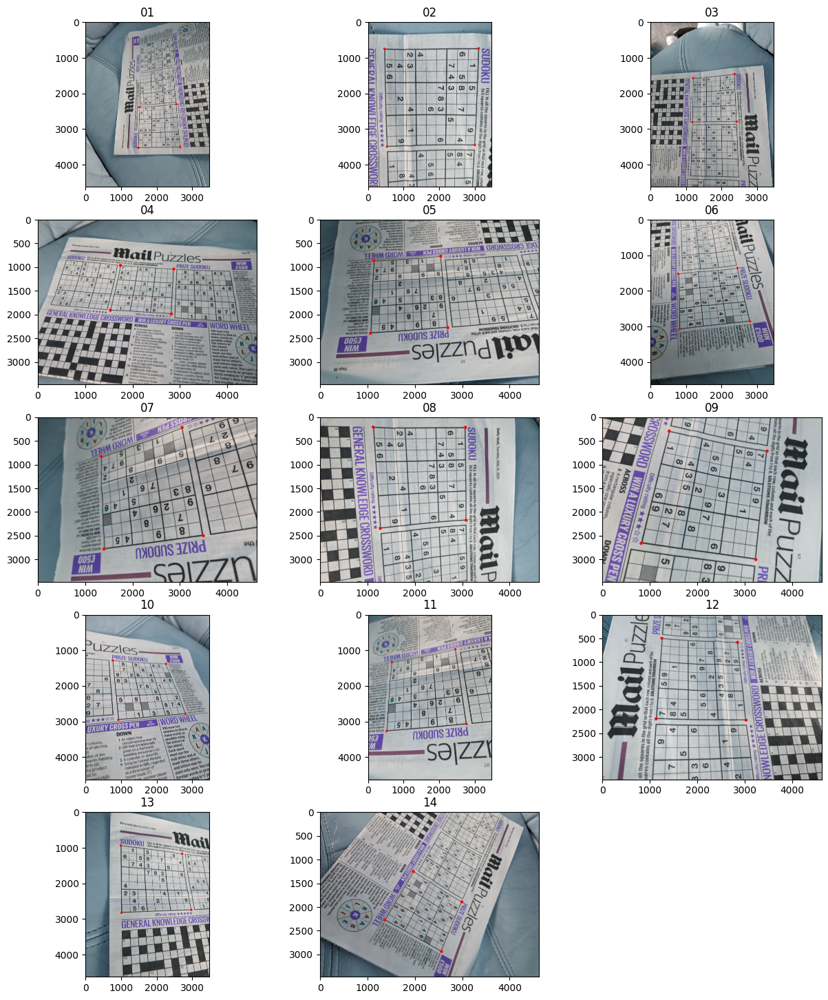

In [9]:
# Should really do this much earlier on to reduce the work done on
# all the contours...
ARC_LENGTH_THRESHOLD = 0.1
big_solid_squares = [
    cv2.approxPolyDP(
        cnt,
        ARC_LENGTH_THRESHOLD*cv2.arcLength(cnt,True),
        True,
    )
    for cnt in biggest_solid_central_cnts
]

images_cpy = [(title, np.copy(img)) for title, img in images]
for (title, img), cnts in zip(images_cpy, big_solid_squares):
    cv2.circle(img, cnts[0][0], 32, (255, 0, 0), -1)
    cv2.circle(img, cnts[1][0], 32, (255, 0, 0), -1)
    cv2.circle(img, cnts[2][0], 32, (255, 0, 0), -1)
    cv2.circle(img, cnts[3][0], 32, (255, 0, 0), -1)

show_images(images_cpy)

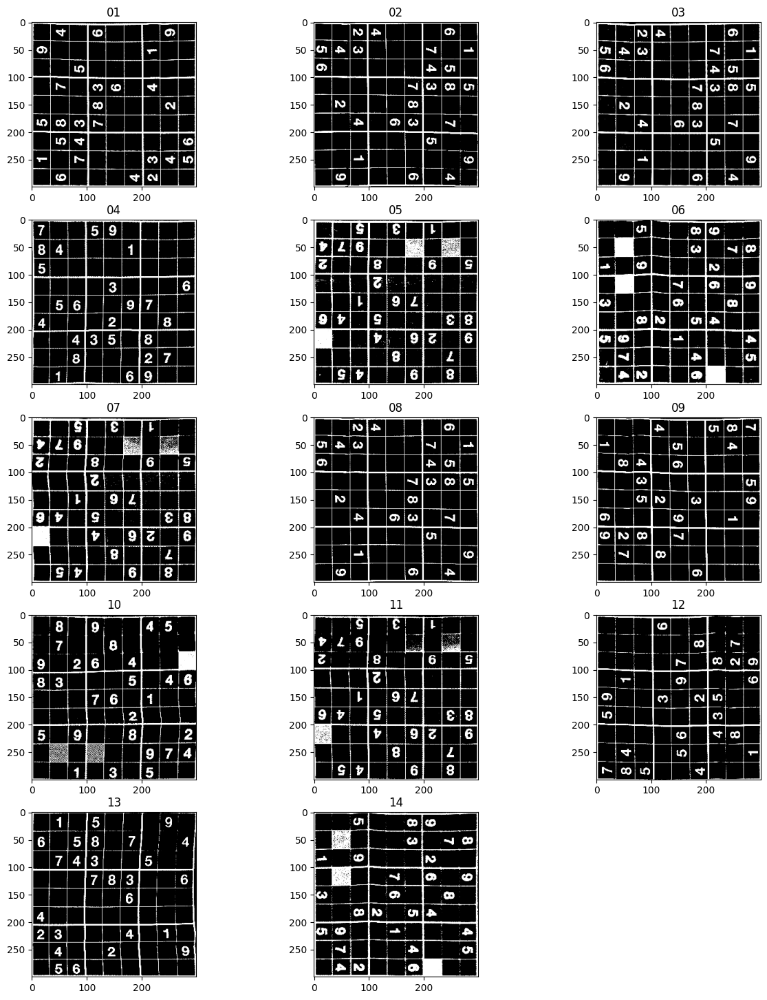

In [11]:
def sort_points(p):
    points = [point[0] for point in p]
    # Sort points based on their y-coordinates (y-values)
    points = sorted(points, key=lambda p: p[1])
    
    # The first two points are the top points and the last two are the bottom points
    top_points = points[:2]
    bottom_points = points[2:]
    
    # Sort the top points by their x-coordinates
    top_points = sorted(top_points, key=lambda p: p[0])
    top_left = top_points[0]
    top_right = top_points[1]
    
    # Sort the bottom points by their x-coordinates
    bottom_points = sorted(bottom_points, key=lambda p: p[0])
    bottom_left = bottom_points[0]
    bottom_right = bottom_points[1]
    
    return [top_left, top_right, bottom_left, bottom_right]

target = np.float32([
    [0,0],
    [300,0],
    [0,300],
    [300,300],
])

transforms = [
    cv2.getPerspectiveTransform(
        np.float32(sort_points(box)),
        target
    )
    for box in big_solid_squares
]

warped = [
    (
        title, 
        cv2.warpPerspective(img, M, (300,300))
    )
    for (title, img), M in zip(inverted, transforms)
]

show_images(warped, 'grey')